In [10]:
# Import required module
import os
import subprocess

# Step 1: Instal                    l dependencies only if required
try:
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    from PIL import Image
    import glob
    from tqdm import tqdm
    import seaborn as sns
    import torch
    import torchvision.models as models
    import torchvision.transforms as transforms
    from sklearn.metrics.pairwise import cosine_similarity
    import torch.nn as nn
    import torch.nn.functional as F
    from torch_geometric.nn import GCNConv
    from scipy.stats import rankdata
    from torch.utils.data import DataLoader, Dataset
    from sklearn.feature_extraction.text import TfidfVectorizer
    from collections import defaultdict
    import random
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import StandardScaler
    from sklearn.cluster import KMeans
    from torch_geometric.utils import add_self_loops
    from sklearn.metrics import roc_auc_score
    from sklearn.preprocessing import MinMaxScaler
    from sklearn.metrics import precision_score, recall_score, f1_score, ndcg_score
    from itertools import chain
    from sklearn.manifold import TSNE
    import networkx as nx

except ImportError:
    print("Installing dependencies...")

    # Install system-level dependencies
    subprocess.run(["apt-get", "update"])
    subprocess.run(["apt-get", "install", "-y", "libcairo2", "libcairo2-dev"])

    # Install Python packages
    subprocess.run(["pip", "install", "--quiet", "pycairo"])
    subprocess.run(["pip", "install", "--quiet", "torch torchvision torchaudio"])
    subprocess.run(["pip", "install", "--quiet", "torch-geometric", "torch-scatter", "torch-sparse", "torch-cluster", "torch-spline-conv"])
    subprocess.run(["pip", "install", "--quiet", "pandas", "numpy", "matplotlib", "pillow", "tqdm", "seaborn", "scipy"])
    subprocess.run(["pip", "install", "--quiet", "scikit-learn"])
    subprocess.run(["pip", "install", "--quiet", "networkx"])

    print("All dependencies installed.")

# Step 2: Save the environment to requirements.txt
subprocess.run("pip freeze > requirements.txt", shell=True)
print("Dependencies saved to requirements.txt")


/usr/local/lib/python3.10/site-packages/torch_geometric/typing.py:86: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: /usr/local/lib/python3.10/site-packages/torch_scatter/_version_cpu.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/usr/local/lib/python3.10/site-packages/torch_geometric/typing.py:97: UserWarning: An issue occurred while importing 'torch-cluster'. Disabling its usage. Stacktrace: /usr/local/lib/python3.10/site-packages/torch_cluster/_version_cpu.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev
  warnings.warn(f"An issue occurred while importing 'torch-cluster'. "
/usr/local/lib/python3.10/site-packages/torch_geometric/typing.py:113: UserWarning: An issue occurred while importing 'torch-spline-conv'. Disabling its usage. Stacktrace: /usr/local/lib/python3.10/site-packages/torch_spline_conv/_version_cpu.so: undefined symbol: _ZN3c1017RegisterOp

Dependencies saved to requirements.txt


In [11]:
# Step 3: Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import glob
from tqdm import tqdm
import seaborn as sns
import torch
import torchvision.models as models
import torchvision.transforms as transforms
from sklearn.metrics.pairwise import cosine_similarity
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from scipy.stats import rankdata
from torch.utils.data import DataLoader, Dataset
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import defaultdict
import random
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from torch_geometric.utils import add_self_loops
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import precision_score, recall_score, f1_score, ndcg_score
from itertools import chain
from sklearn.manifold import TSNE
import networkx as nx

In [12]:
# Adjust article ID format
def adjust_id(x):
    x = str(x)
    return "0" + x if len(x) == 9 else x

# Save model checkpoint
def save_checkpoint(model, optimizer, epoch, filename='checkpoint.pth'):
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(checkpoint, filename)

# Load model checkpoint
def load_checkpoint(filename, model, optimizer=None):
    checkpoint = torch.load(filename, map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
    model.load_state_dict(checkpoint['model_state_dict'])
    if optimizer:
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    return checkpoint['epoch']

In [13]:
articles = pd.read_csv('/kaggle/input/h-and-m-personalized-fashion-recommendations/articles.csv')
customers = pd.read_csv('/kaggle/input/h-and-m-personalized-fashion-recommendations/customers.csv')
# sample_submission = pd.read_csv('/kaggle/input/h-and-m-personalized-fashion-recommendations/sample_submission.csv')
transactions = pd.read_csv('/kaggle/input/h-and-m-personalized-fashion-recommendations/transactions_train.csv')

In [14]:
# Get all paths from the image folder
all_image_paths = glob.glob("/kaggle/input/h-and-m-personalized-fashion-recommendations/images/*/*.jpg")  # Adjust if images are PNG

# Adjust the article ID and product code to be string & add "0"
articles["article_id"] = articles["article_id"].apply(lambda x: adjust_id(x))
articles["product_code"] = articles["article_id"].apply(lambda x: x[:3])

# Get all valid article IDs and create a set to store image IDs
all_image_ids = set()

for path in tqdm(all_image_paths, desc="Processing Images"):
    article_id = os.path.basename(path).split('.')[0]  # Extract image ID from filename
    all_image_ids.add(article_id)

Processing Images: 100%|██████████| 105100/105100 [00:00<00:00, 802581.96it/s]


In [15]:
# Construct full image paths and filter invalid ones
images_path = "/kaggle/input/h-and-m-personalized-fashion-recommendations/images/"
articles["path"] = articles["article_id"].apply(
    lambda x: images_path + x[:3] + "/" + x + ".jpg" if x in all_image_ids else None
)

# Filter out articles without valid images
articles_with_images = articles[articles["path"].notna()].reset_index(drop=True)

# Save the filtered articles to a new file (optional)
articles_with_images.to_csv("articles_with_images.csv", index=False)


In [16]:
def create_age_interval(x):
    if x <= 25:
        return [16, 25]
    elif x <= 35:
        return [26, 35]
    elif x <= 45:
        return [36, 45]
    elif x <= 55:
        return [46, 55]
    elif x <= 65:
        return [56, 65]
    else:
        return [66, 99]

In [17]:
# Fill missing values
customers.fillna({
    "FN": 0,
    "Active": 0,
    "club_member_status": "UNKNOWN",
    "fashion_news_frequency": "UNKNOWN",
    "age": customers["age"].median()
}, inplace=True)

customers["fashion_news_frequency"] = customers["fashion_news_frequency"].replace({"None": "NONE"})
customers["age_interval"] = customers["age"].apply(create_age_interval)

trasactions

In [18]:
# Adjust article_id (as did for articles dataframe)
transactions["article_id"] = transactions["article_id"].apply(lambda x: adjust_id(x))

# Filter the transactions dataset to keep only valid article IDs
transactions_filtered = transactions[transactions["article_id"].isin(set(articles_with_images["article_id"]))].reset_index(drop=True)

# Optionally save the filtered transactions dataset
transactions_filtered.to_csv("transactions_filtered.csv", index=False)


In [20]:
# Set random seed for reproducibility
np.random.seed(42)
random.seed(42)

In [21]:
# Define numerical features
numerical_columns = [
    'product_type_no', 'colour_group_code', 'index_group_no',
    'section_no', 'garment_group_no', 'graphical_appearance_no'
]

# Ensure all numerical columns exist before proceeding
if all(col in articles_with_images.columns for col in numerical_columns):
    # Normalize numerical features
    scaler = MinMaxScaler()
    articles_with_images[numerical_columns] = scaler.fit_transform(articles_with_images[numerical_columns])
else:
    raise ValueError("Error: One or more numerical columns are missing!")


In [22]:
# Define text features
if all(col in articles_with_images.columns for col in ['detail_desc', 'prod_name', 'product_type_name', 'product_group_name',
                                           'graphical_appearance_name', 'colour_group_name', 'index_name',
                                           'index_group_name', 'section_name', 'garment_group_name']):
    articles_with_images['text_data'] = (
        articles_with_images['detail_desc'].fillna('') + ' ' +
        articles_with_images['prod_name'].fillna('') + ' ' +
        articles_with_images['product_type_name'].fillna('') + ' ' +
        articles_with_images['product_group_name'].fillna('') + ' ' +
        articles_with_images['graphical_appearance_name'].fillna('') + ' ' +
        articles_with_images['colour_group_name'].fillna('') + ' ' +
        articles_with_images['index_name'].fillna('') + ' ' +
        articles_with_images['index_group_name'].fillna('') + ' ' +
        articles_with_images['section_name'].fillna('') + ' ' +
        articles_with_images['garment_group_name'].fillna('')
    )
else:
    raise ValueError("Error: One or more textual columns are missing!")

In [24]:
# Load pre-trained GloVe embeddings (for example, GloVe 100D embeddings)
def load_glove_embeddings(glove_file_path):
    embeddings_index = {}
    with open(glove_file_path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            vector = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = vector
    return embeddings_index

# Example usage (change the path to your GloVe file)
glove_file_path = '/kaggle/input/test-feature-1/glove.6B.100d.txt'
embeddings_index = load_glove_embeddings(glove_file_path)

# Checking a sample word embedding
# print(embeddings_index['king'])  # Example of checking the embedding for 'king'


In [25]:
# Function to convert text data to embeddings using GloVe
def text_to_glove_embeddings(text_data, embeddings_index, embedding_dim=100):
    embeddings = []
    for text in text_data:
        words = text.split()  # Split the text into words
        word_embeddings = np.zeros(embedding_dim)
        valid_word_count = 0
        
        # For each word, get its GloVe embedding (if it exists)
        for word in words:
            if word in embeddings_index:
                word_embeddings += embeddings_index[word]
                valid_word_count += 1
        
        # Average the embeddings of the words in the text
        if valid_word_count > 0:
            word_embeddings /= valid_word_count
        embeddings.append(word_embeddings)
    
    return np.array(embeddings)

# Convert the product descriptions to GloVe embeddings
text_embeddings = text_to_glove_embeddings(articles_with_images['text_data'], embeddings_index)


In [26]:
# Stack numerical features and text embeddings
features = np.hstack([
    articles_with_images[numerical_columns].values,  # Normalized numerical features
    text_embeddings  # GloVe embeddings for text data
])

# Perform clustering using KMeans
kmeans = KMeans(n_clusters=10, random_state=42)
articles_with_images['cluster'] = kmeans.fit_predict(features)


In [27]:
# Function to generate positive indices based on Product-Relation Graph (PR Graph)
def get_positive_indices(idx, product_group_name, colour_group_code, cluster_id, article_id):
    # Find articles with the same product group and colour group
    group_indices = articles_with_images[
        (articles_with_images['product_group_name'] == product_group_name) &
        (articles_with_images['colour_group_code'] == colour_group_code)
    ].index.tolist()

    # If there are fewer than 10, fall back to cluster-based grouping
    if len(group_indices) < 10:
        group_indices = articles_with_images[articles_with_images['cluster'] == cluster_id].index.tolist()

    # If there are still fewer than 10, return the available ones (no co-purchase)
    if not group_indices:
        return []

    # Return a random sample of up to 10 positive indices

    return group_indices[:10]

    # return random.sample(group_indices, min(10, len(group_indices)))

# Apply the positive indices generation function to the dataset
articles_with_images['positive_indices'] = articles_with_images.apply(
    lambda row: get_positive_indices(
        row.name, 
        row['product_group_name'], 
        row['colour_group_code'], 
        row['cluster'], 
        row['article_id']
    ),
    axis=1
)


In [28]:
# Function to generate hard negatives based on PR Graph
def generate_hard_negatives(total_items, positive_sets, num_samples=10):
    """
    Implements HARD NEGATIVE SAMPLING (as in C-STAR).
    Selects items that are similar to positives (same product group & cluster)
    but were NOT co-purchased.
    """
    all_indices = np.arange(total_items)
    negative_indices = []

    # Precompute the exclusions (positive sets) to avoid repeated `isin` calls
    exclusions = {i: set(positive_sets.iloc[i]) for i in range(total_items)}

    for i, positive_set in enumerate(positive_sets):
        product_group = articles_with_images.iloc[i]['product_group_name']
        cluster_id = articles_with_images.iloc[i]['cluster']

        # Filter articles in the same product group and cluster, excluding the positive set
        similar_articles = articles_with_images[
            (articles_with_images['product_group_name'] == product_group) &
            (articles_with_images['cluster'] == cluster_id)
        ].index.tolist()

        # Remove articles already in the positive set
        similar_articles = [idx for idx in similar_articles if idx not in exclusions[i]]

        # If there are enough similar articles, select the top `num_samples`
        if len(similar_articles) >= num_samples:
            # Select top `num_samples` (we can keep the first `num_samples` without randomness)
            sampled_negatives = similar_articles[:num_samples]
        else:
            # If not enough similar articles, sample from the entire dataset, excluding the positive set and the current article
            valid_negatives = np.setdiff1d(all_indices, list(positive_set) + [i])
            sampled_negatives = valid_negatives[:min(num_samples, len(valid_negatives))]

        negative_indices.append(sampled_negatives)

    return negative_indices

# Generate Negative Indices
total_items = len(articles_with_images)
positive_sets = articles_with_images['positive_indices'].apply(set)
articles_with_images['negative_indices'] = generate_hard_negatives(total_items, positive_sets)


data splitting

In [29]:
def geometric_distributed_sampling(ranks, rho=0.5, max_samples=300000):
    """
    Optimized Geometric Distributed Sampling (GDS) with category limit fix.
    Ensures probabilities remain valid by normalizing ranks.
    """
    # Sort transactions by rank (latest transactions get highest rank)
    sorted_indices = torch.argsort(ranks, descending=True)

    # Take only a **manageable** subset for sampling
    max_categories = min(len(ranks), 16_000_000)  # Limit to prevent exceeding `2^24`
    filtered_indices = sorted_indices[:max_categories]  # Consider only recent transactions

    # Normalize ranks within the selected subset
    ranks_subset = ranks[filtered_indices]
    normalized_ranks = (ranks_subset - ranks_subset.min()) / (ranks_subset.max() - ranks_subset.min() + 1e-8)

    # Compute probabilities
    probabilities = torch.exp(-rho * normalized_ranks)
    probabilities /= probabilities.sum()  # Normalize to sum = 1

    # Sample safely within the limit
    sampled_relative_indices = torch.multinomial(probabilities, num_samples=min(max_samples, len(filtered_indices)), replacement=False)

    # Map back to original transaction indices
    sampled_indices = filtered_indices[sampled_relative_indices]

    return sampled_indices

In [30]:
# Convert transaction date to datetime if not already
transactions_filtered['t_dat'] = pd.to_datetime(transactions_filtered['t_dat'])

# Sort transactions by date only once
transactions_filtered = transactions_filtered.sort_values('t_dat', ascending=True)

# Fast NumPy-Based Train/Validation/Test Cutoff Calculation
cutoffs = transactions_filtered['t_dat'].quantile([0.75, 0.875, 1.0]).values
train_cutoff, val_cutoff, test_cutoff = cutoffs  # 75% Train, 12.5% Val, 12.5% Test

# Assign Ranks Efficiently
transactions_filtered["rank"] = transactions_filtered['t_dat'].rank(method="first", ascending=True)

# Use NumPy for Efficient Rank Tensor Conversion
ranks_tensor = torch.tensor(transactions_filtered["rank"].to_numpy(dtype=np.float32))


In [31]:
# Optimized Geometric Distributed Sampling (GDS)
total_samples = 300000  # Adjust this to control dataset size
sampled_indices = geometric_distributed_sampling(ranks_tensor, rho=0.5, max_samples=total_samples)

# Directly Filter Sampled Transactions (No Reset Index Needed)
transactions_sampled = transactions_filtered.iloc[sampled_indices.numpy()].reset_index(drop=True)

# Fast Train/Validation/Test Split Using NumPy Masking
train_mask = transactions_sampled['t_dat'] <= train_cutoff
val_mask = (transactions_sampled['t_dat'] > train_cutoff) & (transactions_sampled['t_dat'] <= val_cutoff)
test_mask = (transactions_sampled['t_dat'] > val_cutoff) & (transactions_sampled['t_dat'] <= test_cutoff)

train_transactions = transactions_sampled[train_mask]
val_transactions = transactions_sampled[val_mask]
test_transactions = transactions_sampled[test_mask]

# Optimized Cold Start Customer Filtering (Avoid Loops)
transaction_customers = set(transactions_filtered['customer_id'])  # Fast lookup with set
cold_start_customers = customers[~customers['customer_id'].isin(transaction_customers)]

# Optimized Cold Start Customer Splitting (No Redundant Operations)
train_cold_start, temp_cold_start = train_test_split(
    cold_start_customers, test_size=0.25, random_state=42
)
val_cold_start, test_cold_start = train_test_split(
    temp_cold_start, test_size=0.5, random_state=42
)

# Fast Concatenation Using Pandas (No Extra Indexing)
train_data = pd.concat([train_transactions, train_cold_start])
val_data = pd.concat([val_transactions, val_cold_start])
test_data = pd.concat([test_transactions, test_cold_start])

# Final Print Statements for Verification
print(f"✅ Optimized Data Split Completed!")
print(f"🔹 Total Articles: {len(transactions_filtered)}")
print(f"🔹 Train Data: {len(train_data)} (Including Cold Start)")
print(f"🔹 Validation Data: {len(val_data)} (Including Cold Start)")
print(f"🔹 Test Data: {len(test_data)} (Including Cold Start)")

✅ Optimized Data Split Completed!
🔹 Total Articles: 31651678
🔹 Train Data: 178308 (Including Cold Start)
🔹 Validation Data: 70887 (Including Cold Start)
🔹 Test Data: 60962 (Including Cold Start)


In [43]:
class GCNLayer(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(GCNLayer, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim)

    def forward(self, features, edge_index):
        row, col = edge_index
        degree = torch.bincount(row, minlength=features.size(0)).float() + 1e-6
        norm = 1.0 / torch.sqrt(degree[row] * degree[col])

        agg_features = torch.zeros_like(features)
        agg_features.index_add_(0, row, features[col] * norm.view(-1, 1))

        return F.relu(self.linear(agg_features))

class C_STAR(nn.Module):
    def __init__(self, input_dim, embedding_dim, edge_index, num_nodes, num_layers=2, dropout=0.3):
        super(C_STAR, self).__init__()

        self.embedding_layer = nn.Sequential(
            nn.Linear(input_dim, embedding_dim),
            nn.ReLU()
        )

        self.gcn_layers = nn.ModuleList([GCNLayer(embedding_dim, embedding_dim) for _ in range(num_layers)])
        self.dropout = dropout
        self.num_nodes = num_nodes
        self.edges = edge_index

        # ✅ FIX: Add reference embedding for inter-trajectory loss
        self.reference_embedding = nn.Parameter(torch.randn(embedding_dim))  # Randomly initialized reference

    def forward(self, features, edge_index):
        embeddings = self.embedding_layer(features)
        embeddings = F.dropout(embeddings, p=self.dropout, training=self.training)

        for gcn_layer in self.gcn_layers:
            embeddings = gcn_layer(embeddings, edge_index)
            embeddings = F.dropout(embeddings, p=self.dropout, training=self.training)

        return embeddings



In [33]:
def sliced_wasserstein_distance(P, Q, num_projections=50):
    """
    Computes the Sliced Wasserstein Distance (SWD) between two trajectory distributions P and Q.
    Uses random projections to compute the distance between the two distributions.
    """
    device = P.device
    proj_vectors = torch.randn((P.shape[1], num_projections), device=device)  # Random projection vectors
    proj_vectors = proj_vectors / torch.norm(proj_vectors, dim=0, keepdim=True)  # Normalize

    P_proj = P @ proj_vectors  # Project P onto vectors
    Q_proj = Q @ proj_vectors  # Project Q onto vectors

    P_sorted, _ = torch.sort(P_proj, dim=0)
    Q_sorted, _ = torch.sort(Q_proj, dim=0)

    return torch.mean(torch.abs(P_sorted - Q_sorted))


def inter_trajectory_loss(embeddings, reference_embedding):
    """
    Computes the inter-trajectory loss using Sliced Wasserstein Distance.
    """
    return sliced_wasserstein_distance(embeddings, reference_embedding)



def intra_trajectory_loss(embeddings, positive_indices, negative_indices, batch_mapping):
    """
    Computes the intra-trajectory loss.
    Ensures positive & negative indices are properly mapped and converted to tensors.
    """
    # ✅ Convert lists to tensors before using `.view(-1)`
    positive_indices = torch.tensor(positive_indices, dtype=torch.long, device=embeddings.device)
    negative_indices = torch.tensor(negative_indices, dtype=torch.long, device=embeddings.device)

    # ✅ Map to local batch indices (if needed)
    positive_indices = torch.tensor(
        [batch_mapping.get(idx, -1) for idx in positive_indices.tolist()],
        dtype=torch.long, device=embeddings.device
    )
    negative_indices = torch.tensor(
        [batch_mapping.get(idx, -1) for idx in negative_indices.tolist()],
        dtype=torch.long, device=embeddings.device
    )

    # ✅ Filter valid indices
    positive_indices = positive_indices[positive_indices >= 0]
    negative_indices = negative_indices[negative_indices >= 0]

    # ✅ Return 0 loss if no valid pairs exist
    if positive_indices.numel() == 0 or negative_indices.numel() == 0:
        return torch.tensor(0.0, requires_grad=True, device=embeddings.device)

    # ✅ Compute cosine similarity for loss
    positive_scores = torch.einsum('ij,ij->i', embeddings[positive_indices], embeddings[positive_indices])
    negative_scores = torch.einsum('ij,ij->i', embeddings[negative_indices], embeddings[negative_indices])

    # ✅ Adaptive margin based on embedding variance
    margin = 1.0 + 0.1 * torch.std(embeddings)
    loss = F.relu(negative_scores + margin - positive_scores).mean()
    
    return loss



In [44]:
# Train Full Batch with Early Stopping function
def train_full_batch_with_early_stopping(
    model,
    train_data,   # ✅ Pandas DataFrame
    val_data,     # ✅ Pandas DataFrame
    articles_with_images,  # ✅ To fetch positive/negative indices
    optimizer,
    all_features,  # Separate numeric features
    edge_index,    # Graph edges [2, num_edges]
    num_epochs=10,
    patience=5
):
    # Convert text and numeric features to tensors inside the function
    # text_embeddings_tensor = torch.tensor(text_embeddings, dtype=torch.float32)
    # all_features_numeric_tensor = torch.tensor(articles_with_images[numerical_columns].values, dtype=torch.float32)

    best_val_loss = float('inf')
    patience_counter = 0
    best_model_state = None
    save_frequency = 5

    with torch.no_grad():
        initial_embeddings = model(all_features, edge_index)
        initial_swd = sliced_wasserstein_distance(initial_embeddings, model.reference_embedding).item()
        print(f"✅ Initial SWD: {initial_swd:.4f}")

    for epoch in range(num_epochs):
        # -----------------------------
        # 1) Training Phase
        # -----------------------------
        model.train()
        optimizer.zero_grad()

        # ✅ 1️⃣ Full forward pass on the entire graph
        all_embeddings = model(all_features, edge_index)  # shape: [num_nodes, embedding_dim]

        # ✅ 2️⃣ Compute total training loss
        train_loss_acc = torch.zeros([], requires_grad=True, device=all_embeddings.device)

        for _, row in train_data.iterrows():
            article_id = row["article_id"]
            article_idx = article_to_index.get(article_id, -1)
            if article_idx == -1:
                continue  # Skip missing articles

            # ✅ Extract `positive_indices` and `negative_indices` from `articles_with_images`
            pos_indices = articles_with_images.loc[articles_with_images["article_id"] == article_id, "positive_indices"].values
            neg_indices = articles_with_images.loc[articles_with_images["article_id"] == article_id, "negative_indices"].values

            pos_indices = torch.tensor(pos_indices[0] if len(pos_indices) > 0 else [], dtype=torch.long, device=all_embeddings.device)
            neg_indices = torch.tensor(neg_indices[0] if len(neg_indices) > 0 else [], dtype=torch.long, device=all_embeddings.device)

            # ✅ Compute losses
            article_embedding = all_embeddings[article_idx].unsqueeze(0)
            inter_loss = inter_trajectory_loss(article_embedding, model.reference_embedding)
            intra_loss = intra_trajectory_loss(all_embeddings, pos_indices, neg_indices, {})

            train_loss_acc = train_loss_acc + (inter_loss + intra_loss)

        # ✅ 3️⃣ Backpropagation
        train_loss_acc.backward()
        optimizer.step()

        # ✅ Compute average training loss
        avg_train_loss = train_loss_acc.item() / max(len(train_data), 1)

        # -----------------------------
        # 2) Compute SWD (After Epoch)
        # -----------------------------
        with torch.no_grad():
            epoch_swd = sliced_wasserstein_distance(all_embeddings, model.reference_embedding).item()

        print(f"📝 Epoch {epoch + 1}/{num_epochs} | Train Loss: {avg_train_loss:.4f} | SWD: {epoch_swd:.4f}")

        # -----------------------------
        # 2) Validation Phase
        # -----------------------------
        model.eval()
        total_val_loss = 0.0

        with torch.no_grad():
            all_val_embeddings = model(all_features, edge_index)

            for _, row in val_data.iterrows():
                article_id = row["article_id"]
                article_idx = article_to_index.get(article_id, -1)
                if article_idx == -1:
                    continue  # Skip missing articles

                pos_indices = articles_with_images.loc[articles_with_images["article_id"] == article_id, "positive_indices"].values
                neg_indices = articles_with_images.loc[articles_with_images["article_id"] == article_id, "negative_indices"].values

                pos_indices = torch.tensor(pos_indices[0] if len(pos_indices) > 0 else [], dtype=torch.long, device=all_val_embeddings.device)
                neg_indices = torch.tensor(neg_indices[0] if len(neg_indices) > 0 else [], dtype=torch.long, device=all_val_embeddings.device)

                article_embedding = all_val_embeddings[article_idx].unsqueeze(0)
                inter_loss = inter_trajectory_loss(article_embedding, model.reference_embedding)
                intra_loss = intra_trajectory_loss(all_val_embeddings, pos_indices, neg_indices, {})

                total_val_loss += (inter_loss + intra_loss)

        avg_val_loss = total_val_loss / max(len(val_data), 1)

        # Print loss
        print(f"Epoch {epoch + 1}/{num_epochs} | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

        # -----------------------------
        # 3) Checkpoint & Early Stopping
        # -----------------------------
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
            best_model_state = model.state_dict()
            save_checkpoint(model, optimizer, epoch, filename='best_checkpoint.pth')
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("🚀 Early stopping triggered! Restoring best model...")
                model.load_state_dict(best_model_state)
                break

    return model


In [53]:
def recommend_articles_for_customer(customer_id, model, articles_with_images, transactions_filtered, edge_index, top_n=10):
    customer_transactions = transactions_filtered[transactions_filtered['customer_id'] == customer_id]
    if customer_transactions.empty:
        raise ValueError(f"No transactions found for Customer ID {customer_id}.")

    # Get purchased articles and map to node indices
    purchased_article_ids = customer_transactions['article_id'].unique()
    purchased_indices = [article_to_index.get(article_id, -1) for article_id in purchased_article_ids]
    purchased_indices = [idx for idx in purchased_indices if idx != -1]

    # Ensure there are valid purchased indices
    if not purchased_indices:
        raise ValueError(f"No matching articles found for Customer ID {customer_id}.")

    # Get embeddings for all products
    with torch.no_grad():
        all_embeddings = model(all_features, edge_index)

    # Compute the customer embedding (average of purchased articles' embeddings)
    customer_embedding = all_embeddings[purchased_indices].mean(dim=0)

    # Compute cosine similarity between customer embedding and all product embeddings
    similarities = F.cosine_similarity(customer_embedding.unsqueeze(0), all_embeddings)

    # Get the top N recommendations based on cosine similarity
    top_indices = torch.topk(similarities, top_n).indices.numpy()

    # Get recommended articles along with their image paths
    recommended_articles = articles_with_images.iloc[top_indices][['article_id', 'prod_name', 'path']]


        # Display the recommended articles and their images
    for index, row in recommended_articles.iterrows():
        print(f"Product Name: {row['prod_name']}")
        img_path = row['path']
        display(Image.open(img_path))  # Display the image from the path
        print("\n")

    return recommended_articles[['article_id', 'prod_name', 'path']]




In [36]:
# Construct the PR-Graph (Product-Relation Graph) based on co-purchase pairs
PR_graph = nx.Graph()

# Add nodes (products) - Using separate text and numeric features now
for idx, row in articles_with_images.iterrows():
    product_id = row['article_id']
    PR_graph.add_node(product_id, text_features=text_embeddings[idx], numeric_features=row[numerical_columns].values)

# Add edges based on co-purchase relationships
co_purchase_pairs = train_data.groupby('customer_id')['article_id'].apply(list)
for articles_list in co_purchase_pairs:
    n = len(articles_list)
    if n > 1:
        for i in range(n):
            for j in range(i + 1, n):
                PR_graph.add_edge(articles_list[i], articles_list[j])

# Map article ids to indices for later use in edge_index
article_to_index = {article_id: idx for idx, article_id in enumerate(PR_graph.nodes)}

# Convert edge list to tensor (edge_index)
edges_indices = [(article_to_index[u], article_to_index[v]) for u, v in PR_graph.edges()]
edge_index = torch.tensor(edges_indices, dtype=torch.long).t().contiguous()

# Add self-loops (common in graph-based models)
edge_index, _ = add_self_loops(edge_index, num_nodes=len(PR_graph.nodes))

# Ensure edge_index dimensions are correct
assert edge_index.size(0) == 2, "Edge index should have two rows: source and target nodes."
assert edge_index.size(1) > 0, "Edge index should have at least one edge."

print("raaaaaaaaaaaaaaan")

raaaaaaaaaaaaaaan


In [37]:
# Create feature matrix for all nodes (text and numerical features are separate)
num_nodes = len(PR_graph.nodes)
input_dim_text = len(text_embeddings[0])  # Text feature dimension (assuming text_embeddings is an array, not DataFrame)
input_dim_numeric = len(numerical_columns)  # Numeric feature dimension

# Initialize the feature matrix for both text and numeric features
all_features_text = torch.zeros((num_nodes, input_dim_text), dtype=torch.float32)
all_features_numeric = torch.zeros((num_nodes, input_dim_numeric), dtype=torch.float32)

# Fill feature matrices with text and numerical features for each node (article)
id_to_row = {row['article_id']: i for i, row in articles_with_images.iterrows()}
for article_id, node_idx in article_to_index.items():
    if article_id in id_to_row:
        row_idx = id_to_row[article_id]
        
        # Fill text features
        all_features_text[node_idx] = torch.tensor(text_embeddings[row_idx], dtype=torch.float32)
        
        # Ensure the numerical features are numeric and handle NaN values
        numeric_values = articles_with_images.iloc[row_idx][numerical_columns]
        
        # Convert to numeric type, errors='coerce' will turn non-numeric values to NaN
        numeric_values = pd.to_numeric(numeric_values, errors='coerce').fillna(0)
        
        # Fill numeric features
        all_features_numeric[node_idx] = torch.tensor(numeric_values.values, dtype=torch.float32)

# Combine all_features_text and all_features_numeric into one feature matrix
all_features = torch.cat([all_features_text, all_features_numeric], dim=-1)  # Shape: [num_nodes, input_dim_text + input_dim_numeric]



In [38]:
# Checkpoint loading and resuming training if applicable
try:
    checkpoint_files = glob.glob('checkpoint_epoch_*.pth')
    if checkpoint_files:
        latest_checkpoint = max(checkpoint_files, key=os.path.getctime)  # Latest by creation time
        start_epoch = load_checkpoint(latest_checkpoint, model, optimizer)
        print(f"Resuming training from epoch {start_epoch + 1}")
except FileNotFoundError:
    start_epoch = 0
    print("No checkpoint found. Starting from scratch.")

In [39]:
# Set the maximum number of edges per customer for random sampling
MAX_EDGES_PER_CUSTOMER = 10

# Process the data in batches to generate edges (if necessary)
edges = []
for articles_list in co_purchase_pairs:
    n = len(articles_list)
    if n > 1:
        # Generate all possible edges between items in the co-purchase list
        all_edges = [(articles_list[i], articles_list[j]) for i in range(n) for j in range(i + 1, n)]
        # Randomly sample a subset of edges (based on MAX_EDGES_PER_CUSTOMER)
        edges.extend(random.sample(all_edges, min(MAX_EDGES_PER_CUSTOMER, len(all_edges))))

In [40]:
# Convert the sampled edges to indices for the edge_index tensor
edges_indices = [(article_to_index[u], article_to_index[v]) for u, v in edges]
edge_index = torch.tensor(edges_indices, dtype=torch.long).t().contiguous()

# Add self-loops to the graph (if needed)
edge_index, _ = add_self_loops(edge_index, num_nodes=num_nodes)

# Input dimension: text and numeric features
input_dim = input_dim_text + input_dim_numeric  # Concatenate text and numeric dimensions

In [41]:
# Ensure correct edge index dimensions
assert edge_index.size(0) == 2, "Edge index should have two rows: source and target nodes."
assert edge_index.size(1) > 0, "Edge index should have at least one edge."

# Validate nodes connected by edges
print("Node pairs connected by edges:")
for i in range(5):  # Show a few edges
    u, v = edge_index[:, i]
    print(f"Edge: {u.item()} -> {v.item()}")

Node pairs connected by edges:
Edge: 77479 -> 66469
Edge: 81039 -> 77479
Edge: 81039 -> 66469
Edge: 69568 -> 80494
Edge: 99578 -> 80494


In [45]:
# Training with updated input dimensions
embedding_dim = 64  # Size of the embeddings
num_layers = 3      # Number of GCN layers
dropout = 0.3       # Dropout rate for regularization
num_projections = 50  # Number of projections for Sliced Wasserstein Distance (SWD)
learning_rate = 1e-4  # Learning rate for the optimizer
weight_decay = 1e-5 

# Use the correct input dimensions for text and numeric features
# input_dim_text = len(text_embeddings[0])  # Text feature dimension
# input_dim_numeric = len(numerical_columns)  # Numeric feature dimension

model = C_STAR(input_dim=input_dim, embedding_dim=embedding_dim, edge_index=edge_index, num_nodes=len(PR_graph.nodes), num_layers=num_layers)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

# Train the model with early stopping
num_epochs = 1
patience = 10
trained_model = train_full_batch_with_early_stopping(
    model=model,
    train_data=train_data,
    val_data=val_data,
    articles_with_images=articles_with_images,
    optimizer=optimizer,
    all_features=all_features,
    edge_index=edge_index,
    num_epochs=num_epochs,
    patience=patience
)

✅ Initial SWD: 0.8036


/tmp/ipykernel_10/4258116987.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  positive_indices = torch.tensor(positive_indices, dtype=torch.long, device=embeddings.device)
/tmp/ipykernel_10/4258116987.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  negative_indices = torch.tensor(negative_indices, dtype=torch.long, device=embeddings.device)


📝 Epoch 1/1 | Train Loss: 0.7560 | SWD: 0.5915


/tmp/ipykernel_10/4258116987.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  positive_indices = torch.tensor(positive_indices, dtype=torch.long, device=embeddings.device)
/tmp/ipykernel_10/4258116987.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  negative_indices = torch.tensor(negative_indices, dtype=torch.long, device=embeddings.device)


Epoch 1/1 | Train Loss: 0.7560 | Val Loss: 0.7749


In [ ]:
def recall_at_k(recommended_articles, relevant_articles, k=10):
    """
    Calculates Recall@K.
    recommended_articles: List of top K recommended articles for the user.
    relevant_articles: List of relevant articles for the user.
    k: Number of recommendations to consider.
    """
    recommended_set = set(recommended_articles[:k])  # Get top K recommended articles
    relevant_set = set(relevant_articles)  # Set of all relevant articles for the user

    # Calculate the intersection of recommended and relevant articles
    intersection = recommended_set.intersection(relevant_set)

    return len(intersection) / len(relevant_set) if len(relevant_set) > 0 else 0.0



def ndcg_at_k(recommended_articles, relevant_articles, k=10):
    """
    Calculates NDCG@K.
    recommended_articles: List of top K recommended articles for the user.
    relevant_articles: List of relevant articles for the user.
    k: Number of recommendations to consider.
    """
    recommended_set = set(recommended_articles[:k])  # Get top K recommended articles
    dcg = 0.0
    idcg = 0.0

    # Calculate DCG (Discounted Cumulative Gain)
    for i in range(min(k, len(recommended_articles))):
        if recommended_articles[i] in relevant_articles:
            dcg += 1 / np.log2(i + 2)  # +2 because ranking starts from 1 and log2(1) is 0

    # Calculate IDCG (Ideal Discounted Cumulative Gain)
    for i in range(min(k, len(relevant_articles))):
        idcg += 1 / np.log2(i + 2)

    return dcg / idcg if idcg > 0 else 0.0


In [ ]:
def test_model_full_batch_with_metrics(model, test_data, text_embeddings, numeric_columns, edge_index, k=10):
    """
    Full-batch evaluation for C-STAR with Recall@K and NDCG@K metrics.
    Computes test loss without using DataLoader and evaluates the model's recommendation effectiveness.
    """
    model.eval()
    total_test_loss = 0.0
    all_recall_at_k = []
    all_ndcg_at_k = []

    with torch.no_grad():
        # Get all embeddings for the test phase
        all_test_embeddings = model(text_embeddings, numeric_columns, edge_index)  # [num_nodes, embedding_dim]

        # Iterate through the test data
        for _, row in test_data.iterrows():
            customer_id = row["customer_id"]
            article_id = row["article_id"]
            
            # Get the list of articles purchased by the customer (relevant articles)
            customer_transactions = transactions_filtered[transactions_filtered['customer_id'] == customer_id]
            relevant_articles = customer_transactions['article_id'].unique()

            # Map article IDs to indices
            article_idx = article_to_index.get(article_id, -1)
            if article_idx == -1:
                continue  # Skip invalid articles

            # Get the embeddings of all articles (products)
            customer_embedding = all_test_embeddings[article_idx].unsqueeze(0)

            # Compute cosine similarity between customer embedding and all product embeddings
            similarities = F.cosine_similarity(customer_embedding.unsqueeze(0), all_test_embeddings)

            # Get the top K recommended articles
            top_indices = torch.topk(similarities, k).indices.numpy()
            recommended_articles = [list(article_to_index.keys())[idx] for idx in top_indices]

            # Calculate Recall@K and NDCG@K for the customer
            recall = recall_at_k(recommended_articles, relevant_articles, k)
            ndcg = ndcg_at_k(recommended_articles, relevant_articles, k)

            # Store the metrics
            all_recall_at_k.append(recall)
            all_ndcg_at_k.append(ndcg)

            # Compute loss (Inter-trajectory and Intra-trajectory loss)
            positive_indices = articles_with_images.loc[articles_with_images["article_id"] == article_id, "positive_indices"].values[0]
            negative_indices = articles_with_images.loc[articles_with_images["article_id"] == article_id, "negative_indices"].values[0]

            inter_loss = inter_trajectory_loss(customer_embedding, model.reference_embedding, num_projections=50)
            intra_loss = intra_trajectory_loss(all_test_embeddings, positive_indices, negative_indices, {})

            total_test_loss += (inter_loss + intra_loss).item()

    # Normalize loss
    avg_test_loss = total_test_loss / len(test_data)
    avg_recall_at_k = np.mean(all_recall_at_k)
    avg_ndcg_at_k = np.mean(all_ndcg_at_k)

    print(f"✅ Test Loss: {avg_test_loss:.4f}")
    print(f"✅ Recall@{k}: {avg_recall_at_k:.4f}")
    print(f"✅ NDCG@{k}: {avg_ndcg_at_k:.4f}")

    return avg_test_loss, avg_recall_at_k, avg_ndcg_at_k




In [ ]:
# Testing the model with Recall@K and NDCG@K evaluation
k = 10  # Number of top recommendations to evaluate
test_model_full_batch_with_metrics(
    model=trained_model,
    test_data=test_data,
    text_embeddings=text_embeddings,  # Pass text features
    numeric_columns=numeric_columns,  # Pass numeric features
    edge_index=edge_index,
    k=k
)

Product Name: Ophelia Brazilian Azalea


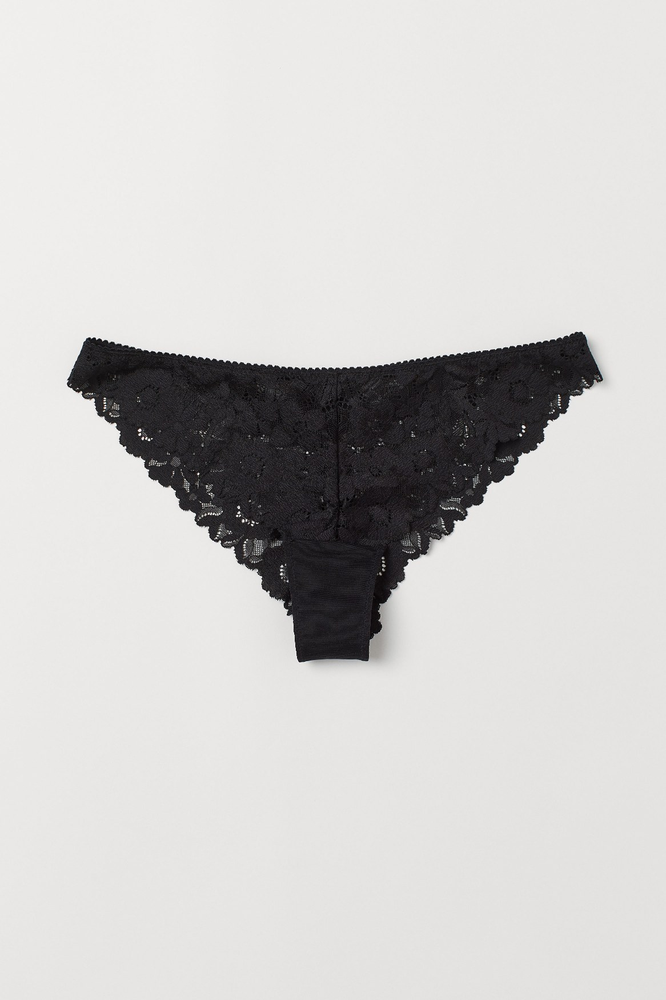



Product Name: Embrace S.Skinny H.W Trash


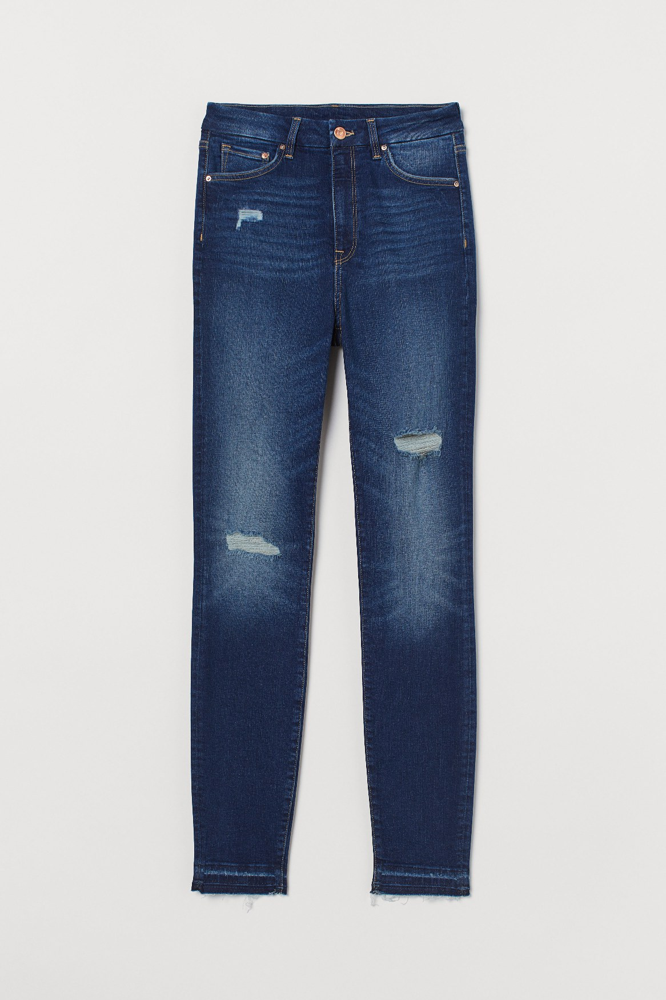



Product Name: Cava Shirt dress


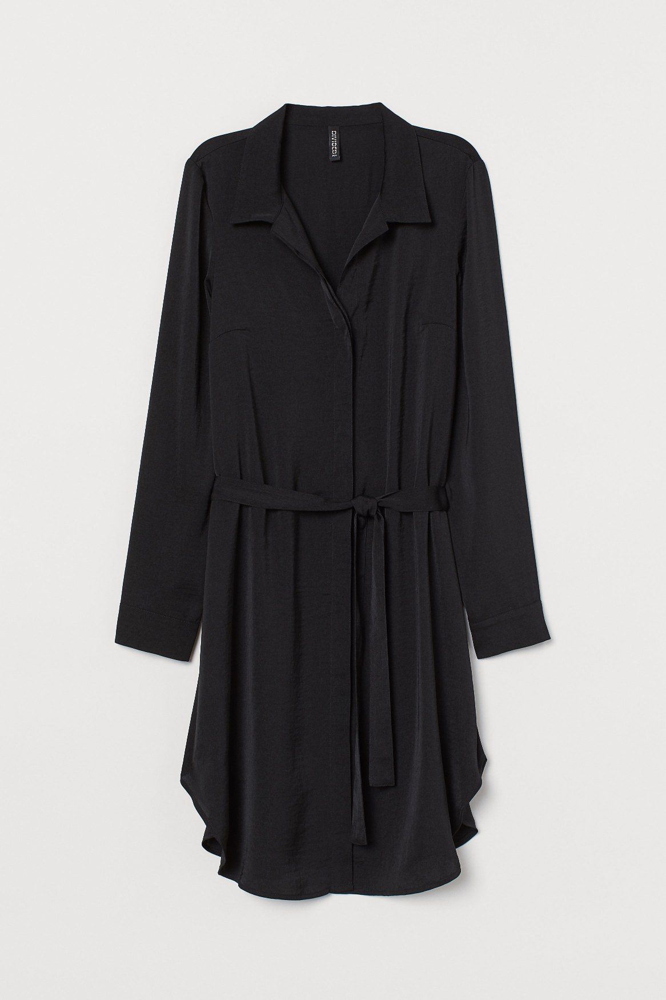



Product Name: TLC coat


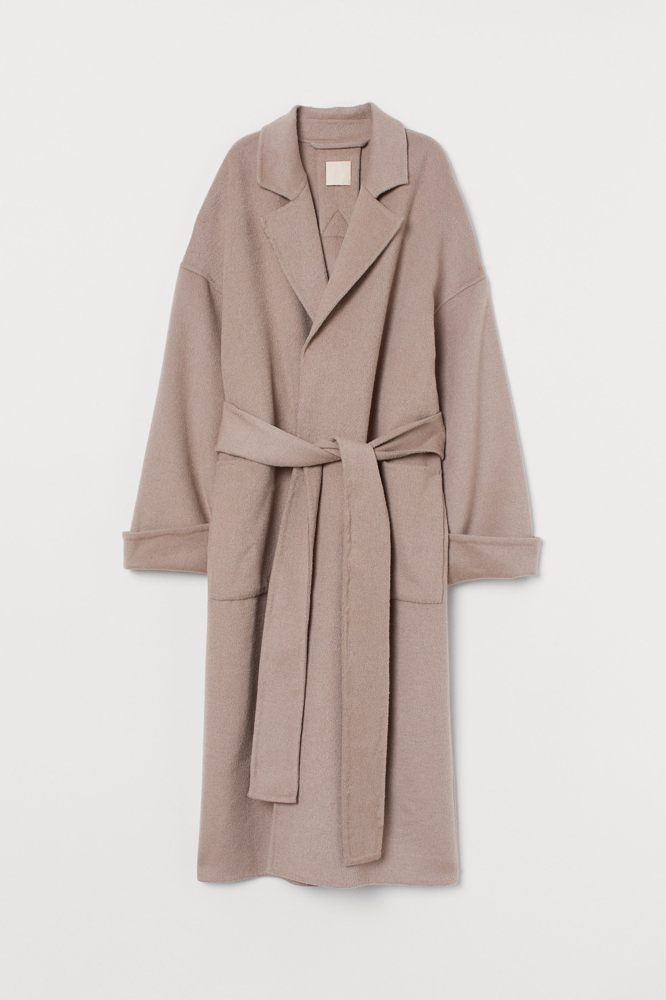



Product Name: Push Up Shaping H.W ankle


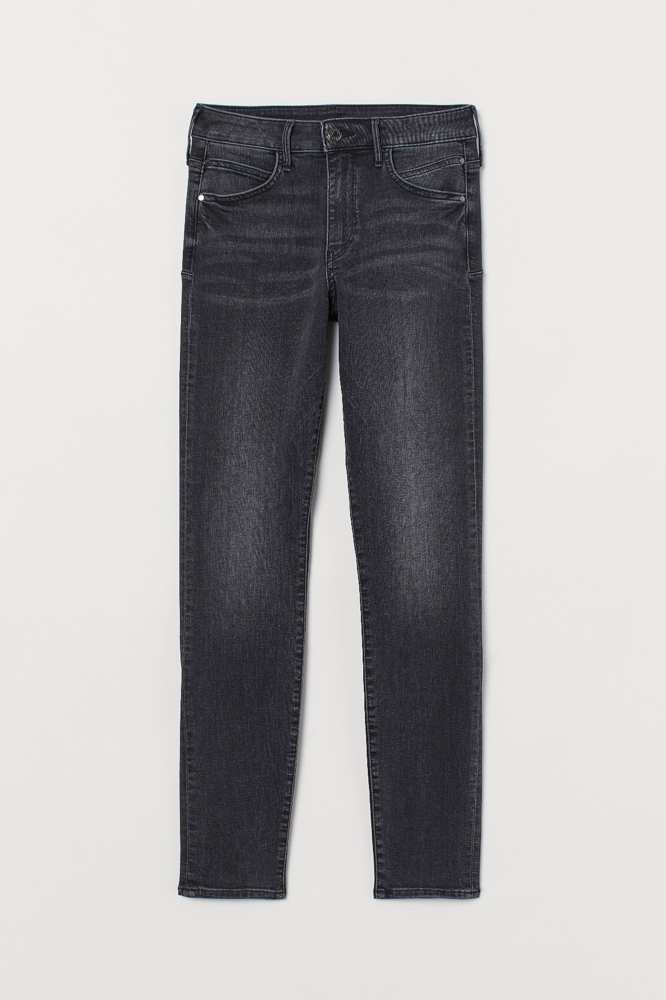



Product Name: Morgan Halloween Leggings


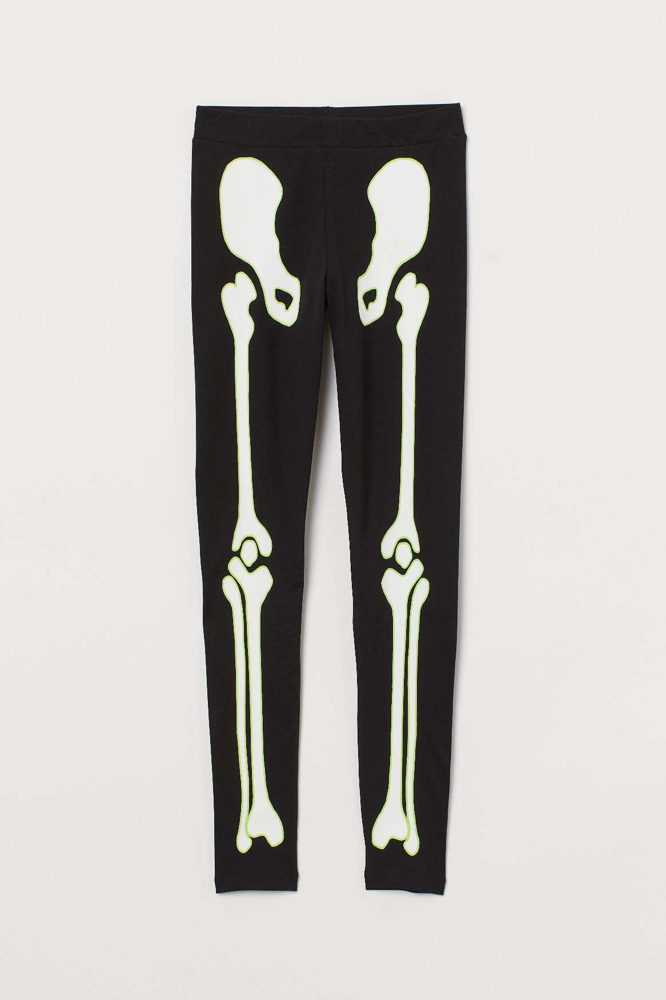



Product Name: Granny Tie Tanga


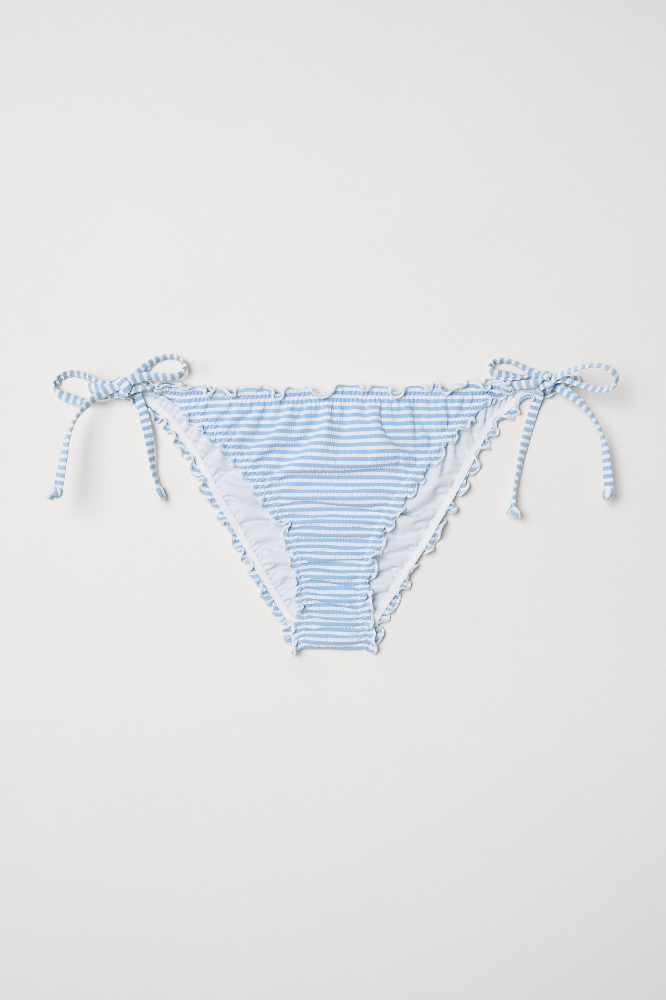



Product Name: DENZEL basic OH BB


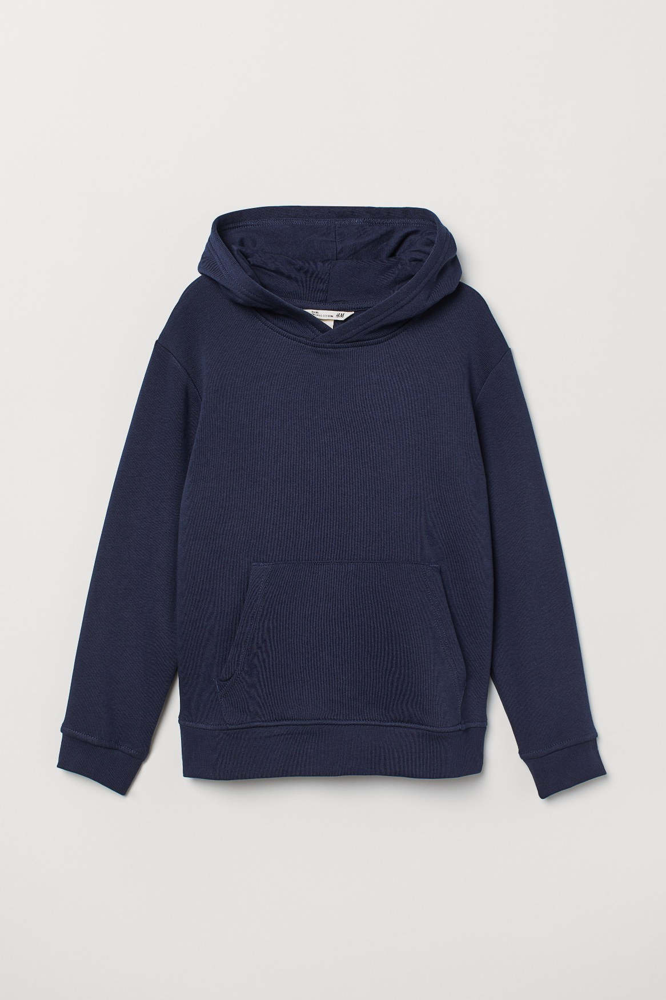



Product Name: Moss PU biker


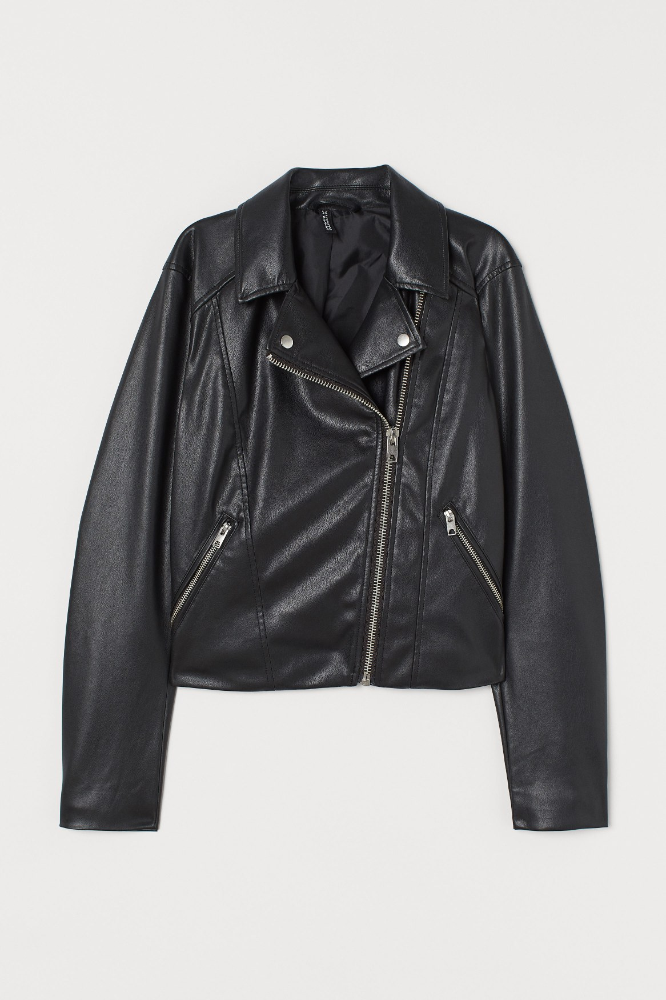



Product Name: Evelina Unpad body LS


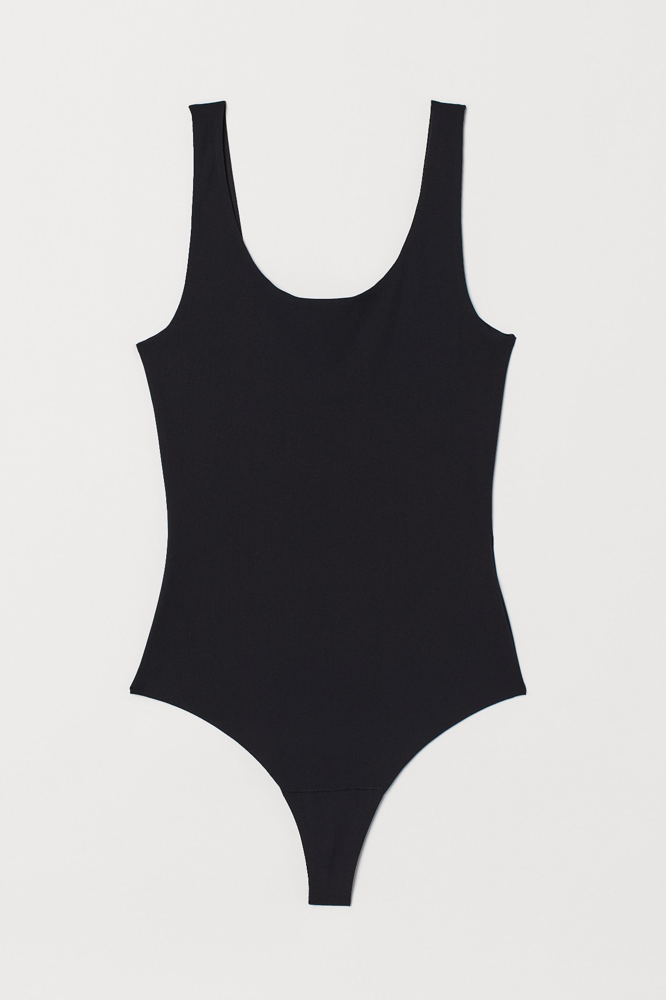



Recommendations for Customer ID 000058a12d5b43e67d225668fa1f8d618c13dc232df0cad8ffe7ad4a1091e318
       article_id                   prod_name  \
72756  0771005001    Ophelia Brazilian Azalea   
60878  0732842004  Embrace S.Skinny H.W Trash   
92618  0856440001            Cava Shirt dress   
75851  0784265002                    TLC coat   
74684  0779842004   Push Up Shaping H.W ankle   
70764  0763153001   Morgan Halloween Leggings   
30338  0629758005            Granny Tie Tanga   
2934   0443696020          DENZEL basic OH BB   
80225  0802881001               Moss PU biker   
60665  0732206001       Evelina Unpad body LS   

                                                    path  
72756  /kaggle/input/h-and-m-personalized-fashion-rec...  
60878  /kaggle/input/h-and-m-personalized-fashion-rec...  
92618  /kaggle/input/h-and-m-personalized-fashion-rec...  
75851  /kaggle/input/h-and-m-personalized-fashion-rec...  
74684  /kaggle/input/h-and-m-personalized-fashion-rec...  
70764  

In [55]:
# Example usage
customer_id = "000058a12d5b43e67d225668fa1f8d618c13dc232df0cad8ffe7ad4a1091e318"  # Replace with a valid customer ID
recommendations = recommend_articles_for_customer(
    customer_id=customer_id,
    model=model,
    articles_with_images=articles_with_images,
    transactions_filtered=transactions_filtered,
    edge_index=edge_index,
    top_n=10
)

print("Recommendations for Customer ID", customer_id)
print(recommendations)
